##### Purpose of the notebook ####

Run inferCNV on the CosMX data using the immune cells as a reference

In [1]:
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings
import os

/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
adata = sc.read_h5ad("/home/augusta/SSS_mount/insituCNV/data/WTx-CosMx_TVA/round2/221/adata_221_processed.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 347023 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

In [26]:
# Ensure 'ROI_status' is treated as a categorical column
adata.obs['ROI_status'] = adata.obs['ROI_status'].astype('category')

# Add "undefined" as a new category (without inplace)
adata.obs['ROI_status'] = adata.obs['ROI_status'].cat.add_categories("undefined")

# Now replace NaN values with "undefined"
adata.obs['ROI_status'].fillna('undefined', inplace=True)

/tmp/ipykernel_1041696/2005868127.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata.obs['ROI_status'].fillna('undefined', inplace=True)


In [27]:
adata.obs.ROI_status.unique()

['undefined', 'healthy']
Categories (2, object): ['healthy', 'undefined']

In [10]:
%pwd

'/home/augusta/SSS_mount/insituCNV/InSituCNV/notebooks/CosMx/221'

In [11]:
adata.layers['logcounts'] = adata.X.copy()

In [14]:
import sys

# Display the current system paths
sys.path

['/home/augusta/SSS_mount/insituCNV/InSituCNV/notebooks/CosMx/221',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python311.zip',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/lib-dynload',
 '',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/site-packages',
 '/home/augusta/anaconda3/envs/scanpy_env/lib/python3.11/site-packages/setuptools/_vendor']

In [15]:
sys.path.append("/home/augusta/SSS_mount/insituCNV/InSituCNV/modules")

# Moments to smoothen

In [ ]:
# sc.pp.subsample(adata,0.1)

In [6]:
import warnings
import numpy as np
from scipy.sparse import csr_matrix, issparse
from scvelo import logging as logg
from scvelo import settings
from scvelo.preprocessing.neighbors import get_connectivities, get_n_neighs, neighbors, verify_neighbors
from scvelo.preprocessing.utils import normalize_per_cell, not_yet_normalized


def moments(
    data,
    n_neighbors=30,
    n_pcs=None,
    mode="connectivities",
    method="umap",
    use_rep=None,
    use_highly_variable=True,
    copy=False,
):
    """Computes moments for velocity estimation.

    First-/second-order moments are computed for each cell across its nearest neighbors,
    where the neighbor graph is obtained from euclidean distances in PCA space.

    Arguments:
    ---------
    data: :class:`~anndata.AnnData`
        Annotated data matrix.
    n_neighbors: `int` (default: 30)
        Number of neighbors to use.
    n_pcs: `int` (default: None)
        Number of principal components to use.
        If not specified, the full space is used of a pre-computed PCA,
        or 30 components are used when PCA is computed internally.
    mode: `'connectivities'` or `'distances'`  (default: `'connectivities'`)
        Distance metric to use for moment computation.
    method : {{'umap', 'hnsw', 'sklearn', `None`}}  (default: `'umap'`)
        Method to compute neighbors, only differs in runtime.
        Connectivities are computed with adaptive kernel width as proposed in
        Haghverdi et al. 2016 (https://doi.org/10.1038/nmeth.3971).
    use_rep : `None`, `'X'` or any key for `.obsm` (default: None)
        Use the indicated representation. If `None`, the representation is chosen
        automatically: for .n_vars < 50, .X is used, otherwise ‘X_pca’ is used.
    use_highly_variable: `bool` (default: True)
        Whether to use highly variable genes only, stored in .var['highly_variable'].
    copy: `bool` (default: `False`)
        Return a copy instead of writing to adata.

    Returns
    -------
    Ms: `.layers`
        dense matrix with first order moments of spliced counts.
    Mu: `.layers`
        dense matrix with first order moments of unspliced counts.
    """
    adata = data.copy() if copy else data

    layers = [layer for layer in {"raw"} if layer in adata.layers]
    if any([not_yet_normalized(adata.layers[layer]) for layer in layers]):
        normalize_per_cell(adata)

    if n_neighbors is not None and n_neighbors > get_n_neighs(adata):
        warnings.warn(
            "Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version "
            "of scVelo. Please compute neighbors first with Scanpy.",
            DeprecationWarning,
            stacklevel=2,
        )
        neighbors(
            adata,
            n_neighbors=n_neighbors,
            use_rep=use_rep,
            use_highly_variable=use_highly_variable,
            n_pcs=n_pcs,
            method=method,
        )
    verify_neighbors(adata)

    if "spliced" not in adata.layers.keys() or "unspliced" not in adata.layers.keys():
        logg.info(f"computing moments based on {mode}", r=True)
        connectivities = get_connectivities(
            adata, mode, n_neighbors=n_neighbors, recurse_neighbors=False
        )
        adata.layers["Ms"] = (
            csr_matrix.dot(connectivities, csr_matrix(adata.layers["raw"]))
            .astype(np.float32)
            .toarray()
        )
    return adata if copy else None

In [7]:
moments(adata, n_neighbors=30)

computing neighbors
    finished (0:00:25) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities


In [8]:
adata

AnnData object with n_obs × n_vars = 60930 × 18555
    obs: 'Unnamed: 0', 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'version', 'Run_name', 'Run_Tissue_name', 'tissue', 'Panel', 'assay_type', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nCount_falsecode', 'nFeature_falsecode', 'Area.um2', 'cell', 'sid', 'add_cell_id', 'add_ist', 'add_sub', 'n_counts', 'leiden'
    var: 'Unnamed: 0', 'start', 'end', 'width', 'names', 'gene_id', 'symbol', 'ensg', 'chromosome'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw', 'Ms'
    obsp: 'connectivities', 'distances'

# Try the pipeline

In [19]:
adata.obs.ROI_status.unique()

[NaN, 'healthy']
Categories (1, object): ['healthy']

In [16]:
import infercnv_pipeline as ip

Running inferCNV with layer=logcounts, window_size=100, reference_key=ROI_status, reference_cat=['healthy']


100%|██████████████████████████████████████████████████████████████████████████████████████████| 70/70 [00:29<00:00,  2.34it/s]


Running PCA and computing neighbors...
Running CNV Leiden clustering with resolutions: [0.2]
Running Leiden clustering with resolution=0.2
Generating heatmap for groupby=ROI_status, saving as _sample_221_logcounts_w100_ref-ROI_status-healthy_groupby-ROI_status.png
categories: healthy, undefined
var_group_labels: chr1, chr2, chr3, etc.


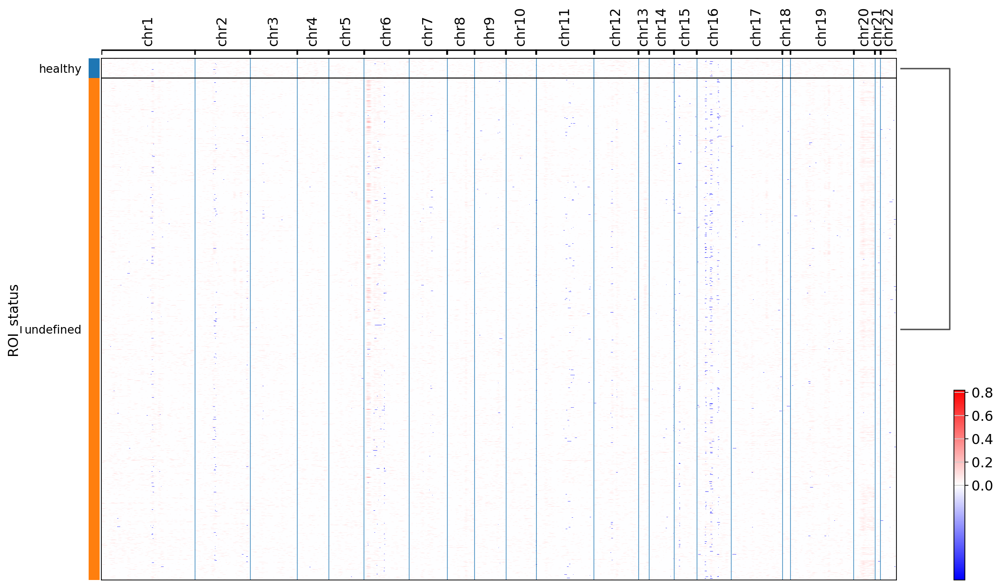

Generating spatial plot for groupby=ROI_status, saving as _sample_221_logcounts_w100_ref-ROI_status-healthy_groupby-ROI_status.png


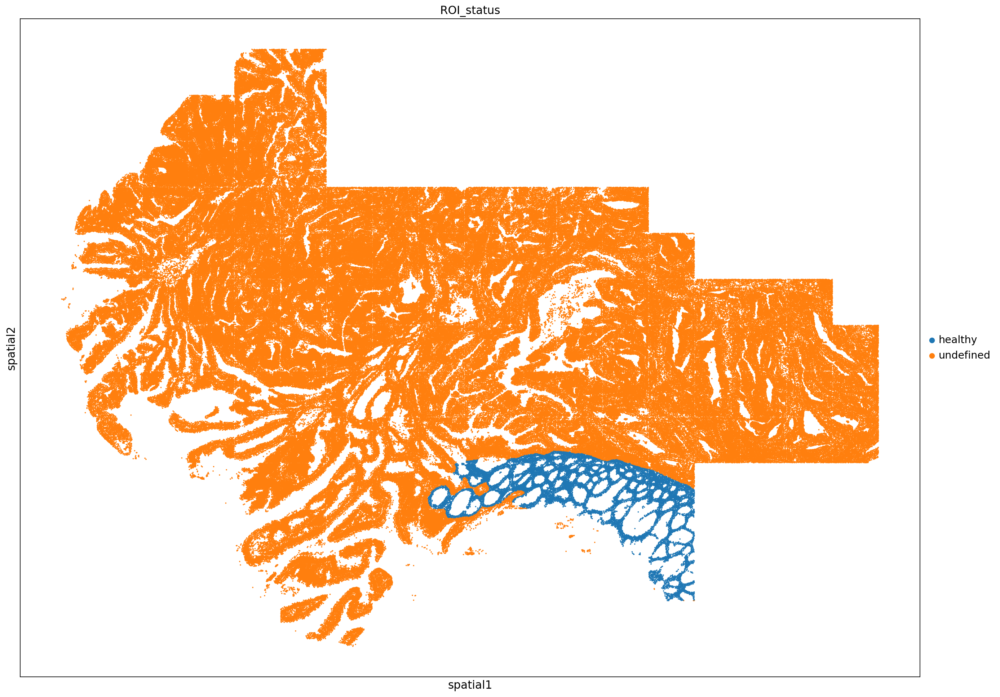

Generating heatmap for groupby=cnv_leiden_res0.2, saving as _sample_221_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2.png
categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


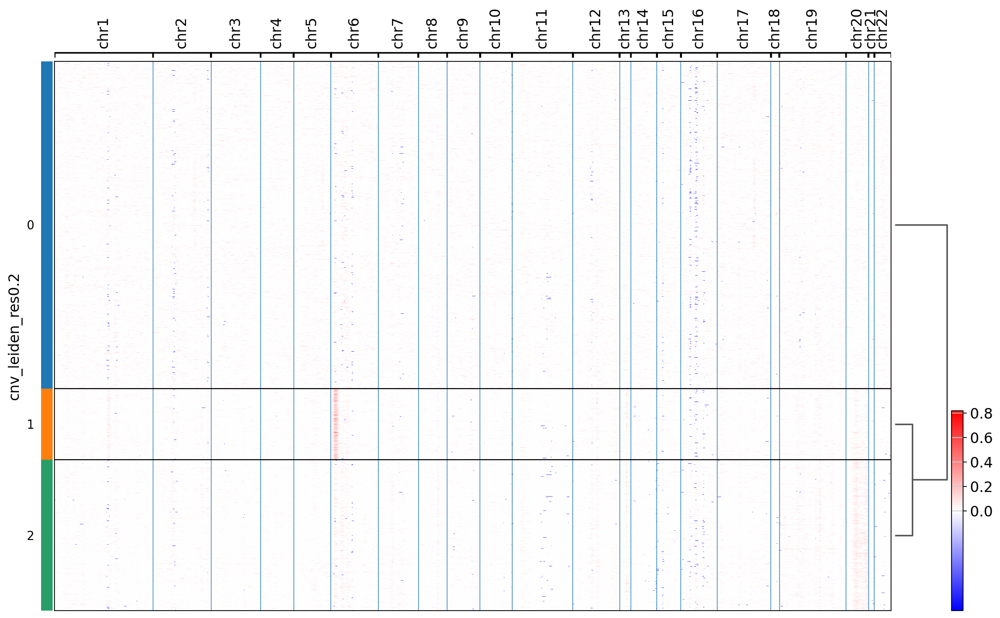

Generating spatial plot for groupby=cnv_leiden_res0.2, saving as _sample_221_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2.png


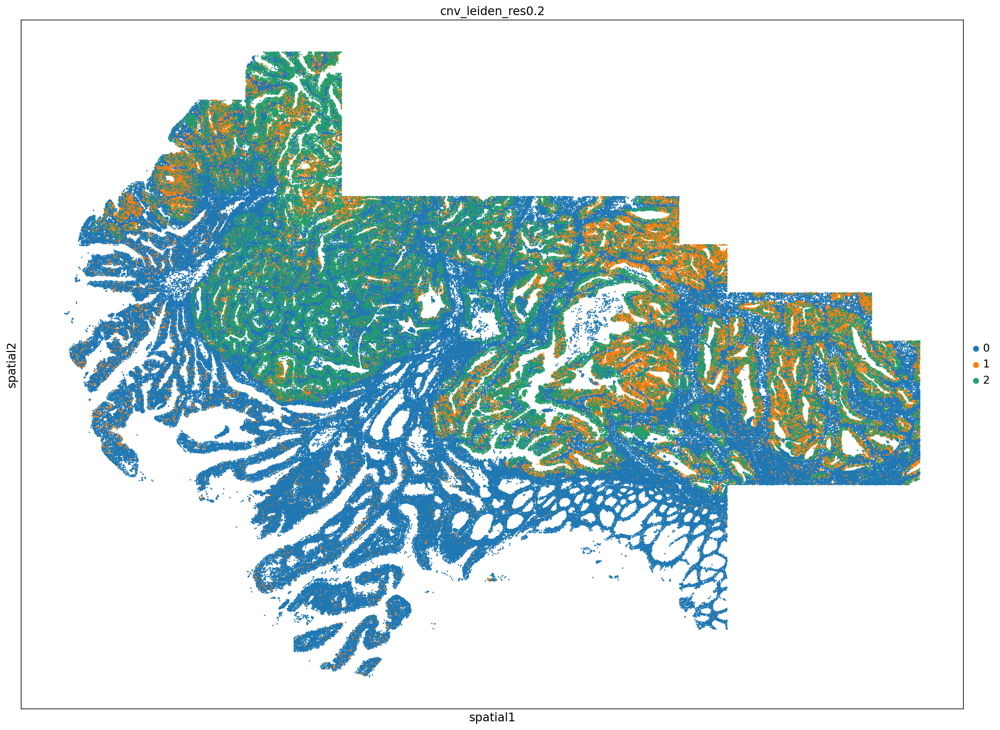

Pipeline complete.


In [28]:
ip.cnv_pipeline(adata, 
                sample_name='221', 
                layer='logcounts',
                window_size=100, 
                reference_key='ROI_status', 
                reference_cat=['healthy'], 
                heatmap_groupby_list=['ROI_status'], 
                cnv_leiden_resolutions=[0.2],
                spot_size = 120)

In [29]:
adata

AnnData object with n_obs × n_vars = 347023 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

In [30]:
adata.write("/home/augusta/SSS_mount/insituCNV/data/WTx-CosMx_TVA/round2/221/adata_221_processed_CNV.h5ad", compression='gzip')

In [31]:
adata.obs['add_sub'].unique()

['epi', 'imm', 'str']
Categories (3, object): ['epi', 'imm', 'str']

In [32]:
adata_ep = adata[adata.obs['add_sub'].isin(['epi']), :].copy()

In [33]:
adata_ep

AnnData object with n_obs × n_vars = 235598 × 18545
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

Generating heatmap for groupby=cnv_leiden_res0.2, saving as _show_sample_221_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2_onlyepi.png
categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


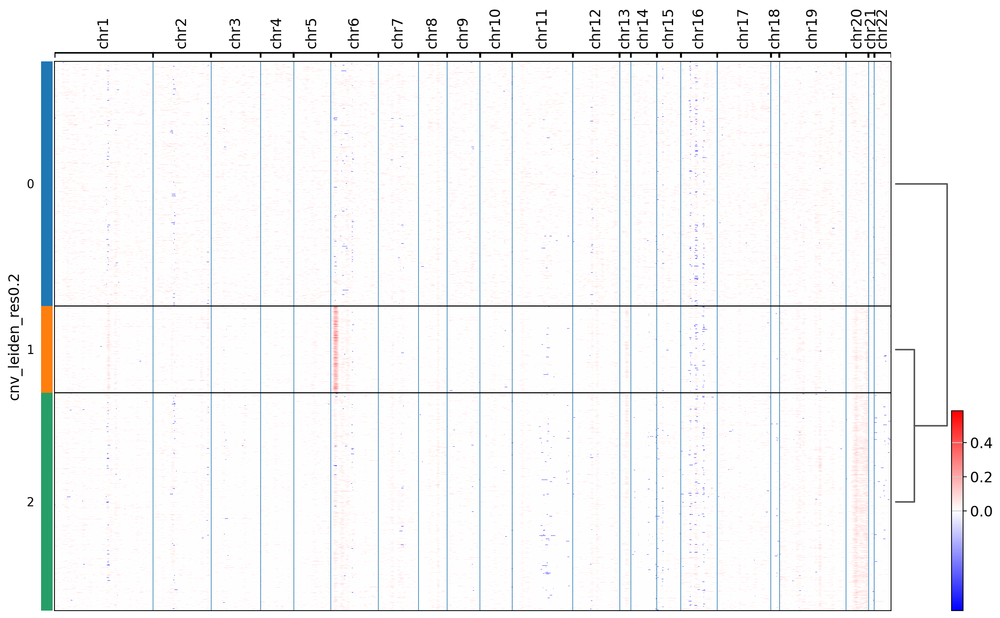

Generating spatial plot for groupby=cnv_leiden_res0.2, saving as _show_sample_221_logcounts_w100_ref-ROI_status-healthy_groupby-cnv_leiden_res0.2_onlyepi.png


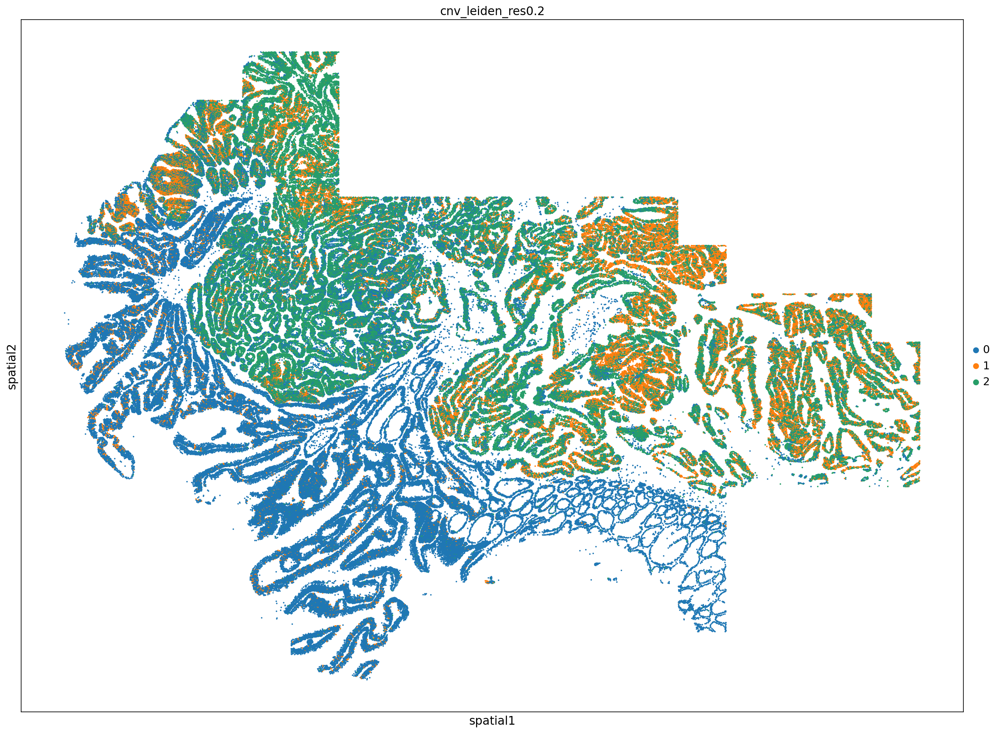

In [34]:
heatmap_groupby=['cnv_leiden_res0.2']

for groupby in heatmap_groupby:
    save_name = f'_show_sample_221_logcounts_w100_ref-ROI_status-healthy_groupby-{groupby}_onlyepi.png'
    ip.step3_heatmap(adata_ep, heatmap_groupby=groupby, save_heatmap=save_name)
    ip.step4_spatialplot(adata_ep, spot_size=130, heatmap_groupby=groupby, save_spatialplot=save_name)

In [ ]:
adata_ep.write("/home/augusta/SSS_mount/insituCNV/data/WTx-CosMx_TVA/round2/221/adata_221_processed_CNV_onlyepi.h5ad", compression='gzip')